## CT Split

Combining the ADT and mRNA results into one object, then splitting into 3 broad cell types for further processing.

In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns
import pickle as pkl
from functools import reduce

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=12

1.4.5.post1


In [3]:
prefix = '/data/codec/production.run/mrna/'

### Load in Data

In [4]:
path = prefix + 'pkls/wells.sng.w_covars.pkl'

# with open(path,'wb') as file:
#     pkl.dump(wells, file)
    
with open(path,'rb') as file:
    wells = pkl.load(file)

### Adjust Cell Barcodes, Filter

I'm adjusting the cell barcodes to make them match their well number, which I also did with the ADTs.

In [5]:
for well in wells:
    wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]

### Concatenate

In [6]:
concat = dict()

In [ ]:
concat['adata'] = wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1,12)]) # I really shouldn't do this, I should go back and run cellranger aggr, but for now just concatenate

In [ ]:
concat['adata'].var['n_counts'] = concat['adata'].var[[i for i in concat['adata'].var.columns if i.startswith('n_counts')]].sum(axis=1)

In [ ]:
concat['raw'] = concat['adata'].copy()

### Filter Genes, Transform Data

Drop genes with very low counts.

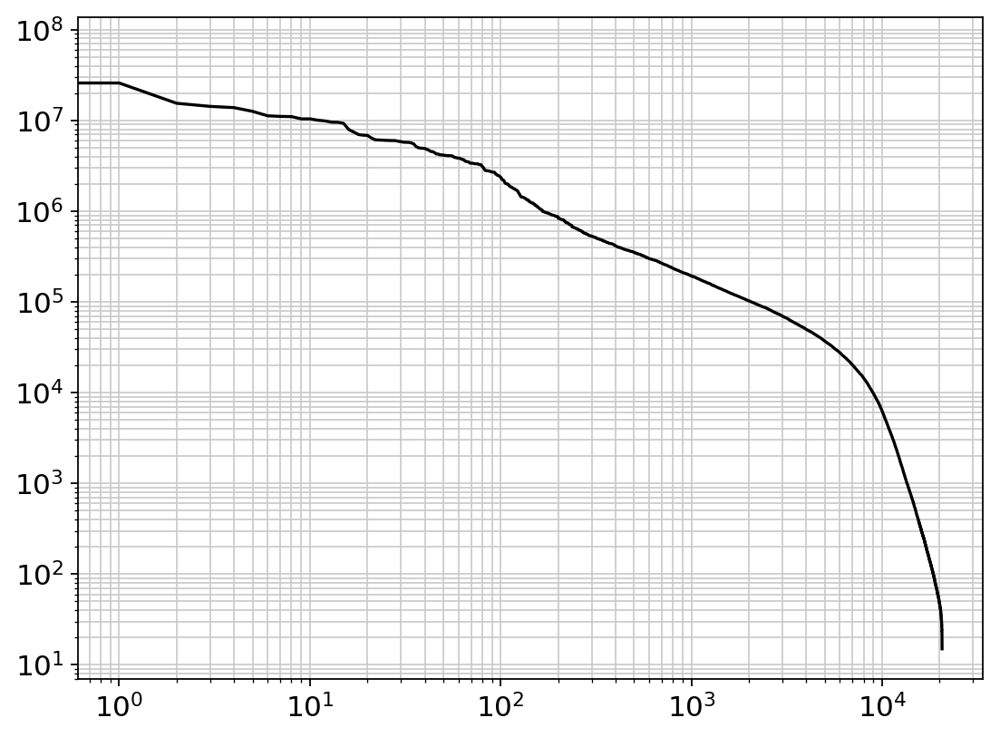

In [13]:
plt.figure(figsize=(8,6))
plt.plot(range(len(concat['adata'].var_names)), 
         concat['adata'].var['n_counts'].sort_values(ascending=False).values, 
         color='k')
plt.grid(False)
plt.grid(True, 'both', 'both')
plt.xscale('log')
plt.yscale('log')

In [14]:
# remove any genes that are now empty
sc.pp.filter_genes(concat['adata'], min_counts=100, inplace=True)

filtered out 2765 genes that are detected in less than 100 counts


In [15]:
sc.pp.normalize_per_cell(concat['adata'], counts_per_cell_after=1e6)

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [16]:
sc.pp.log1p(concat['adata'])

### Store Some Data

For posterity...

In [5]:
path = prefix + 'pkls/concat.norm.log.pkl'

# with open(path,'wb') as file:
#     pkl.dump(concat, file)
    
with open(path,'rb') as file:
    concat = pkl.load(file)

In [12]:
path = prefix + 'obs/concat.obs.csv'
concat['adata'].obs.to_csv(path)

In [6]:
path = prefix + 'obs/concat.bcs.txt'

with open(path,'w') as file:
    for bc in concat['adata'].obs_names:
        file.write(bc + '\n')

### Dimensionality Reduction, Visualization and Clustering

In [5]:
concat['unscaled'] = concat['adata'].copy()

In [6]:
sc.pp.scale(concat['adata'])

    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.


computing PCA with n_comps = 200
    finished (0:17:37)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


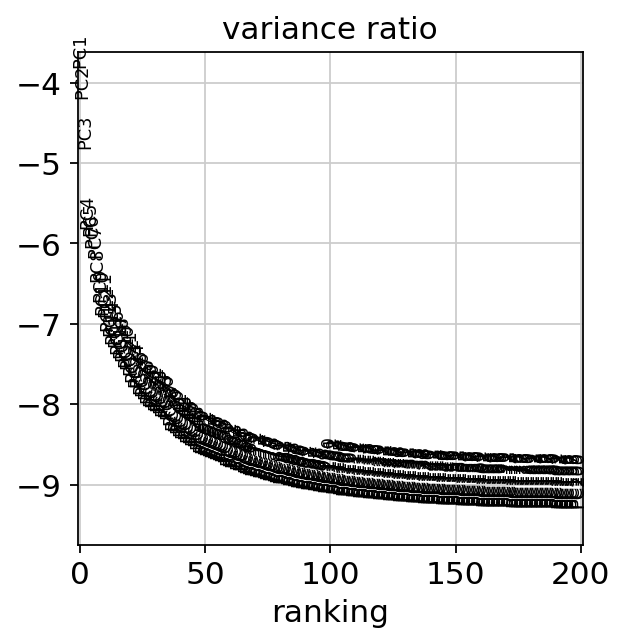

In [7]:
warnings.filterwarnings('ignore')
sc.pp.pca(concat['adata'],n_comps=200)
sc.pl.pca_variance_ratio(concat['adata'],log=True, n_pcs=200)
warnings.filterwarnings('default')

In [11]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(concat['adata'],n_neighbors=15,n_pcs=100) # using all available embeddings, numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 100
    computed neighbors (0:01:26)
    computed connectivities (0:00:06)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:01:34)


In [18]:
sc.tl.umap(concat['adata'])

computing UMAP
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:05:16)


Phew, that took a while... save to disk to avoid having to do that ever again.

In [4]:
path = prefix + 'pkls/concat.dimred.pkl'

# with open(path,'wb') as file:
#     pkl.dump(concat, file, protocol=4)
    
with open(path,'rb') as file:
    concat = pkl.load(file)

In [ ]:
sc.tl.leiden(concat['adata'],resolution=0.5)

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(20,10))
for color, ax in zip(['cond', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

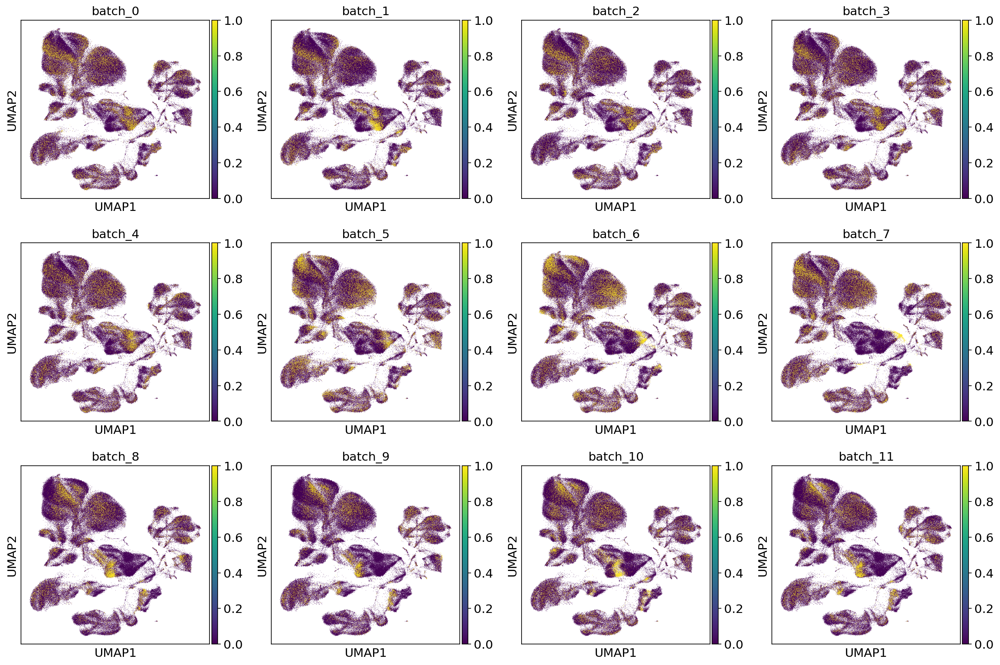

In [9]:
batches = concat['adata'].obs['batch'].unique() # get a list of the batches

# make a new column in the `.obs` for each batch that is of dtype `int` and that just takes on values of 0 and 1 so that it gets plotted as a continuous variable instead of a categorical one
for batch in batches:
    concat['adata'].obs['batch_%s' % batch] = (concat['adata'].obs['batch'] == batch).astype(int)
    
# plot now with sort_order=True, which should apply to this new continuous variable
sc.pl.umap(concat['adata'], color=['batch_%s' % i for i in batches],sort_order=True, ncols=4)

Great projection, lots of interesting stuff going on.

### Incoporate ADTs

In [6]:
path = prefix + '../adts/pkls/concat.adts.norm.log.pkl'
    
with open(path,'rb') as file:
    concat_adts = pkl.load(file)

In [7]:
transcripts = concat['adata'].var_names
proteins = concat_adts['adata'].var_names

I've decided to just put ADTs in the `.obs` for now.

In [8]:
adts_df = pd.DataFrame(concat_adts['adata'].X, columns=proteins, index=concat_adts['adata'].obs_names)

In [9]:
concat_adts['adata'].obs.drop(columns='batch', inplace=True)

In [10]:
concat_adts['adata'].obs.columns = ['n_counts_adts']

In [11]:
adts_df = adts_df.join(concat_adts['adata'].obs)

In [12]:
# # Use this in case this is not the first time running
# concat['adata'].obs.drop(columns=proteins.tolist() + ['n_count_adts'],inplace=True)

In [13]:
concat['adata'].obs = concat['adata'].obs.join(adts_df)

Visualize some genes and proteins:

In [ ]:
check_name = ['HLA']
for i in proteins:
    for j in check_name:
        if j in i:
            print(i)

In [ ]:
check_name = ['HLA']
for i in transcripts:
    for j in check_name:
        if j in i:
            print(i)

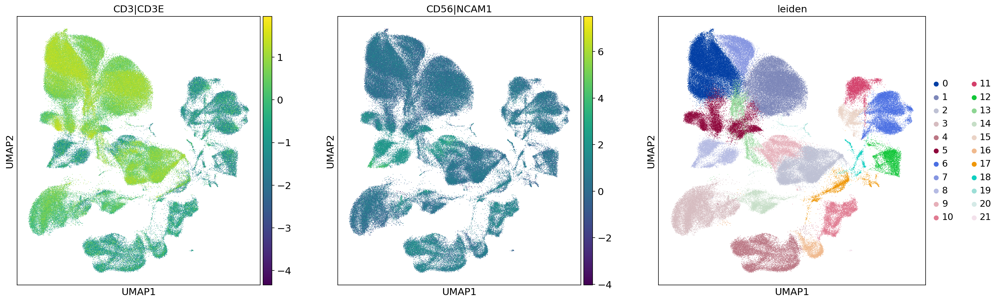

In [15]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD3|CD3E', 'CD56|NCAM1', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

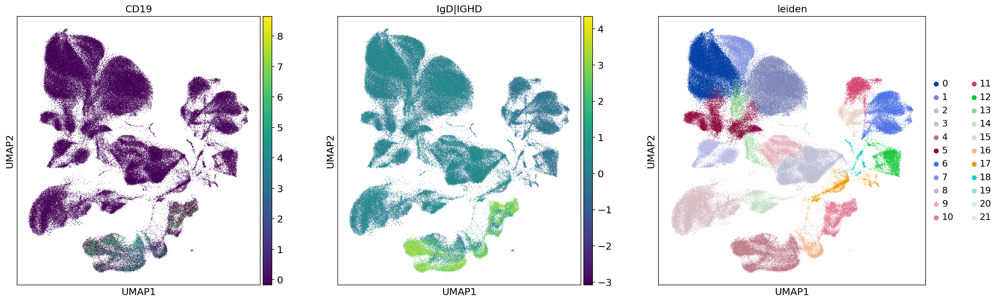

In [16]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD19','IgD|IGHD', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

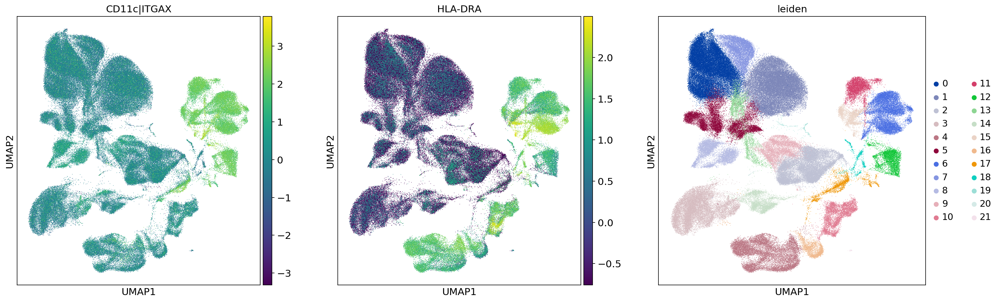

In [17]:
fig, ax = plt.subplots(1, 3, figsize=(23,7))
for color, ax in zip(['CD11c|ITGAX','HLA-DRA', 'leiden'], ax):
    sc.pl.umap(concat['adata'],color=color, ax=ax, show=False, return_fig=False, size=2)

### Split into Broad Cell Types

In [ ]:
cts = ['tnk','b','m']

In [14]:
ct_tnk = [0, 1, 2, 3, 5, 7, 8, 9, 13, 14, 19, 20]
ct_b = [4, 10, 16]
ct_m = [6, 11, 12, 15, 17, 18, 21]

In [15]:
ctdict = dict()
ctdict['tnk'] = ct_tnk
ctdict['b'] = ct_b
ctdict['m'] = ct_m
concat['adata'].obs['ct1'] = concat['adata'].obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        concat['adata'].obs['ct1'].replace(r'^%s$' % str(clust), ct, regex=True, inplace=True)
concat['adata'].obs['ct1'] = concat['adata'].obs['ct1'].astype('category')

... storing 'DROPLET.TYPE' as categorical
... storing 'cond' as categorical
... storing 'exp_id' as categorical
... storing 'free_id' as categorical
... storing 'pool_code' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


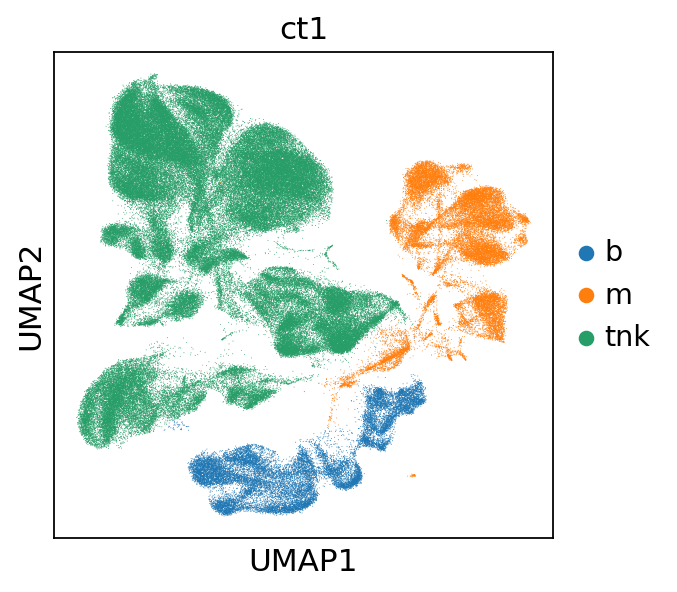

In [16]:
sc.pl.umap(concat['adata'], color=['ct1'])

### Store to Disk

In [18]:
for ct in tqdm(cts):
    ct_dict = dict()
    ct_dict['adata'] = concat['adata'][concat['adata'].obs['ct1'] == ct].copy()
    ct_dict['raw'] = concat['raw'][concat['adata'].obs['ct1'] == ct].copy()
    # forgoing the unscaled for now, not sure if I really need it...
#     ct_dict['unscaled'] = concat['unscaled'][concat['adata'].obs['ct1'] == ct].copy()
    
    path = prefix + '../pkls/cts/%s.pkl' % ct

    with open(path,'wb') as file:
        pkl.dump(ct_dict, file, protocol=4)

In [1]:
cts = ['tnk','b','m']
ct_dicts = dict()

In [6]:
for ct in tqdm(cts):
    path = prefix + '../pkls/cts/%s.pkl' % ct
    
    with open(path,'rb') as file:
        ct_dicts[ct] = pkl.load(file)

In [16]:
s_genes =  ['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 
            'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 
            'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 
            'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 
            'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 
            'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 
            'CHAF1B', 'BRIP1', 'E2F8'
           ]
g2m_genes = ['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 
             'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 
             'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 
             'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 
             'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'HJURP', 'CDCA3', 
             'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 
             'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 
             'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 
             'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 
             'CENPA'
            ]
s_olap = np.intersect1d(s_genes,ct_dicts['tnk']['adata'].var_names.values)
g_olap = np.intersect1d(g2m_genes,ct_dicts['tnk']['adata'].var_names.values)

In [ ]:
batches = ct_dicts['tnk']['adata'].obs['batch'].unique() # get a list of the batches

# make a new column in the `.obs` for each batch that is of dtype `int` and that just takes on values of 0 and 1 so that it gets plotted as a continuous variable instead of a categorical one
for batch in batches:
    ct_dicts['tnk']['adata'].obs['batch_%s' % batch] = (ct_dicts['tnk']['adata'].obs['batch'] == batch).astype(int)
    
# plot now with sort_order=True, which should apply to this new continuous variable
sc.pl.umap(ct_dicts['tnk']['adata'], color=['batch_%s' % i for i in batches],sort_order=True, ncols=5)